In [1]:

import nltk
import pandas as pd
import numpy as np
import urllib.request
from nltk import pos_tag
from nltk.corpus import stopwords
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.tokenize import RegexpTokenizer
from wordcloud import WordCloud
import os
from PIL import Image
from os import path
import nltk.collocations as collocations
from nltk import FreqDist, bigrams
from nltk.stem import WordNetLemmatizer
import collections
from nltk import bigrams
from nltk.util import ngrams
from IPython.display import display, HTML
nltk.download('wordnet')
from flair.models import RelationExtractor
from collections import Counter


#prerequisites 
#nltk.download('punkt')
#nltk.download('stopwords')
#nltk.download('averaged_perceptron_tagger')
#nltk.download('maxent_ne_chunker')
#nltk.download('words')
#!pip install flair





[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\NatureChad\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [2]:
#open text file in read mode
text_file = open("b.txt", "r", encoding ="utf8")
 
#read whole file to a string
book_raw = text_file.read()
 
#close file
text_file.close()
 
print(book_raw)

Book I


Athena Inspires
the Prince


Sing to me of the man, Muse, the man of twists and turns …
driven time and again off course, once he had plundered
the hallowed heights of Troy.
Many cities of men he saw and learned their minds,
many pains he suffered, heartsick on the open sea,
fighting to save his life and bring his comrades home.
But he could not save them from disaster, hard as he strove—
the recklessness of their own ways destroyed them all,
the blind fools, they devoured the cattle of the Sun
and the Sungod blotted out the day of their return.
Launch out on his story, Muse, daughter of Zeus,
start from where you will—sing for our time too.
                                                  By now,
all the survivors, all who avoided headlong death
were safe at home, escaped the wars and waves.
But one man alone …
his heart set on his wife and his return—Calypso,
the bewitching nymph, the lustrous goddess, held him back,
deep in her arching caverns, craving him for a husband.

In [3]:
word_tokens = nltk.word_tokenize(book_raw) # tokenizing the entire book into tokens
word_tokens

['Book',
 'I',
 'Athena',
 'Inspires',
 'the',
 'Prince',
 'Sing',
 'to',
 'me',
 'of',
 'the',
 'man',
 ',',
 'Muse',
 ',',
 'the',
 'man',
 'of',
 'twists',
 'and',
 'turns',
 '…',
 'driven',
 'time',
 'and',
 'again',
 'off',
 'course',
 ',',
 'once',
 'he',
 'had',
 'plundered',
 'the',
 'hallowed',
 'heights',
 'of',
 'Troy',
 '.',
 'Many',
 'cities',
 'of',
 'men',
 'he',
 'saw',
 'and',
 'learned',
 'their',
 'minds',
 ',',
 'many',
 'pains',
 'he',
 'suffered',
 ',',
 'heartsick',
 'on',
 'the',
 'open',
 'sea',
 ',',
 'fighting',
 'to',
 'save',
 'his',
 'life',
 'and',
 'bring',
 'his',
 'comrades',
 'home',
 '.',
 'But',
 'he',
 'could',
 'not',
 'save',
 'them',
 'from',
 'disaster',
 ',',
 'hard',
 'as',
 'he',
 'strove—',
 'the',
 'recklessness',
 'of',
 'their',
 'own',
 'ways',
 'destroyed',
 'them',
 'all',
 ',',
 'the',
 'blind',
 'fools',
 ',',
 'they',
 'devoured',
 'the',
 'cattle',
 'of',
 'the',
 'Sun',
 'and',
 'the',
 'Sungod',
 'blotted',
 'out',
 'the',
 'day

In [4]:
print(word_tokens.index('Odysseus',0,151539))
# prints number of occurences Ulysses has in total , 422
index_for_Ulysses = [] 
# is our empty list to insert the indexes of the occurences

260


##### now I want to find the +-5 words(5-gram) next to Ulysses

In [5]:
# i want to try this same thing now but with a dictionary of Names so I can later validate my NER algorithm.
# Will no be used for now 
character_list = ['Ulysses','Telemachus','Minerva','Neptune','Agamemnon','Jupyter','Calypso','Circe','Argos','Suitors','Scylla and Charybdis','Polyphemus']

#### Now some visualization of those tokens (without pre-processing)

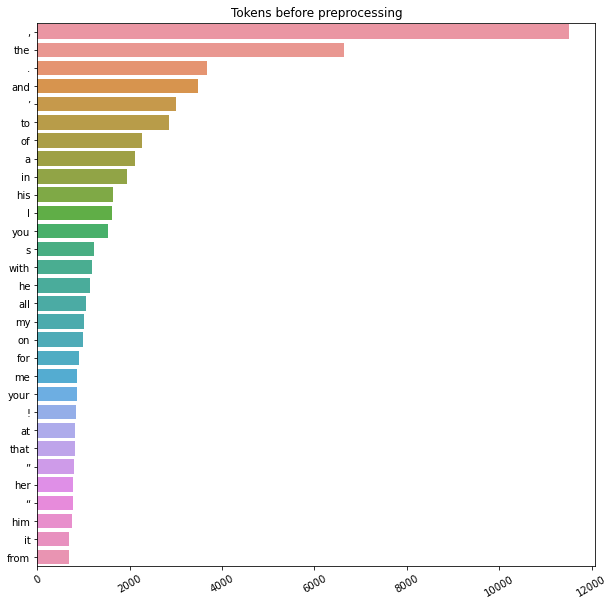

In [6]:
frequency_distribution = nltk.FreqDist(word_tokens).most_common(30) # pick 30 most frequent tokens.


all_fdist = pd.Series(dict(frequency_distribution)) # convert to a pandas series for easier visualization.
fig, ax = plt.subplots(figsize=(10,10))
all_plot = sns.barplot(y=all_fdist.index, x=all_fdist.values, ax=ax).set(title='Tokens before preprocessing') # use seaborn. 
plt.xticks(rotation=30);


## Preprocess 
## NLTK base stopwords do not do a good job - I extend the list

In [7]:
# We first tokenize the words.
# We also need to lowercase since the stopwords in capital are not removed
# We also have to remove "," , "." , "*" , "[ ]" etc. , and we will do that with regex

tokenizer = RegexpTokenizer(r'\w+')
book_after_regexp = tokenizer.tokenize(book_raw)
tokens_lowercase = [token.lower() for token in book_after_regexp]
#stopwords=nltk.corpus.stopwords.words('english') I used the extensive version of it below
#https://gist.github.com/sebleier/554280
stopwords = ["0o", "0s", "3a", "3b", "3d", "6b", "6o", "a", "a1", "a2", "a3", "a4", "ab", "able", "about", "above", "abst", "ac", "accordance", "according", "accordingly", "across", "act", "actually", "ad", "added", "adj", "ae", "af", "affected", "affecting", "affects", "after", "afterwards", "ag", "again", "against", "ah", "ain", "ain't", "aj", "al", "all", "allow", "allows", "almost", "alone", "along", "already", "also", "although", "always", "am", "among", "amongst", "amoungst", "amount", "an", "and", "announce", "another", "any", "anybody", "anyhow", "anymore", "anyone", "anything", "anyway", "anyways", "anywhere", "ao", "ap", "apart", "apparently", "appear", "appreciate", "appropriate", "approximately", "ar", "are", "aren", "arent", "aren't", "arise", "around", "as", "a's", "aside", "ask", "asking", "associated", "at", "au", "auth", "av", "available", "aw", "away", "awfully", "ax", "ay", "az", "b", "b1", "b2", "b3", "ba", "back", "bc", "bd", "be", "became", "because", "become", "becomes", "becoming", "been", "before", "beforehand", "begin", "beginning", "beginnings", "begins", "behind", "being", "believe", "below", "beside", "besides", "best", "better", "between", "beyond", "bi", "bill", "biol", "bj", "bk", "bl", "bn", "both", "bottom", "bp", "br", "brief", "briefly", "bs", "bt", "bu", "but", "bx", "by", "c", "c1", "c2", "c3", "ca", "call", "came", "can", "cannot", "cant", "can't", "cause", "causes", "cc", "cd", "ce", "certain", "certainly", "cf", "cg", "ch", "changes", "ci", "cit", "cj", "cl", "clearly", "cm", "c'mon", "cn", "co", "com", "come", "comes", "con", "concerning", "consequently", "consider", "considering", "contain", "containing", "contains", "corresponding", "could", "couldn", "couldnt", "couldn't", "course", "cp", "cq", "cr", "cry", "cs", "c's", "ct", "cu", "currently", "cv", "cx", "cy", "cz", "d", "d2", "da", "date", "dc", "dd", "de", "definitely", "describe", "described", "despite", "detail", "df", "di", "did", "didn", "didn't", "different", "dj", "dk", "dl", "do", "does", "doesn", "doesn't", "doing", "don", "done", "don't", "down", "downwards", "dp", "dr", "ds", "dt", "du", "due", "during", "dx", "dy", "e", "e2", "e3", "ea", "each", "ec", "ed", "edu", "ee", "ef", "effect", "eg", "ei", "eight", "eighty", "either", "ej", "el", "eleven", "else", "elsewhere", "em", "empty", "en", "end", "ending", "enough", "entirely", "eo", "ep", "eq", "er", "es", "especially", "est", "et", "et-al", "etc", "eu", "ev", "even", "ever", "every", "everybody", "everyone", "everything", "everywhere", "ex", "exactly", "example", "except", "ey", "f", "f2", "fa", "far", "fc", "few", "ff", "fi", "fifteen", "fifth", "fify", "fill", "find", "fire", "first", "five", "fix", "fj", "fl", "fn", "fo", "followed", "following", "follows", "for", "former", "formerly", "forth", "forty", "found", "four", "fr", "from", "front", "fs", "ft", "fu", "full", "further", "furthermore", "fy", "g", "ga", "gave", "ge", "get", "gets", "getting", "gi", "give", "given", "gives", "giving", "gj", "gl", "go", "goes", "going", "gone", "got", "gotten", "gr", "greetings", "gs", "gy", "h", "h2", "h3", "had", "hadn", "hadn't", "happens", "hardly", "has", "hasn", "hasnt", "hasn't", "have", "haven", "haven't", "having", "he", "hed", "he'd", "he'll", "hello", "help", "hence", "her", "here", "hereafter", "hereby", "herein", "heres", "here's", "hereupon", "hers", "herself", "hes", "he's", "hh", "hi", "hid", "him", "himself", "his", "hither", "hj", "ho", "home", "hopefully", "how", "howbeit", "however", "how's", "hr", "hs", "http", "hu", "hundred", "hy", "i", "i2", "i3", "i4", "i6", "i7", "i8", "ia", "ib", "ibid", "ic", "id", "i'd", "ie", "if", "ig", "ignored", "ih", "ii", "ij", "il", "i'll", "im", "i'm", "immediate", "immediately", "importance", "important", "in", "inasmuch", "inc", "indeed", "index", "indicate", "indicated", "indicates", "information", "inner", "insofar", "instead", "interest", "into", "invention", "inward", "io", "ip", "iq", "ir", "is", "isn", "isn't", "it", "itd", "it'd", "it'll", "its", "it's", "itself", "iv", "i've", "ix", "iy", "iz", "j", "jj", "jr", "js", "jt", "ju", "just", "k", "ke", "keep", "keeps", "kept", "kg", "kj", "km", "know", "known", "knows", "ko", "l", "l2", "la", "largely", "last", "lately", "later", "latter", "latterly", "lb", "lc", "le", "least", "les", "less", "lest", "let", "lets", "let's", "lf", "like", "liked", "likely", "line", "little", "lj", "ll", "ll", "ln", "lo", "look", "looking", "looks", "los", "lr", "ls", "lt", "ltd", "m", "m2", "ma", "made", "mainly", "make", "makes", "many", "may", "maybe", "me", "mean", "means", "meantime", "meanwhile", "merely", "mg", "might", "mightn", "mightn't", "mill", "million", "mine", "miss", "ml", "mn", "mo", "more", "moreover", "most", "mostly", "move", "mr", "mrs", "ms", "mt", "mu", "much", "mug", "must", "mustn", "mustn't", "my", "myself", "n", "n2", "na", "name", "namely", "nay", "nc", "nd", "ne", "near", "nearly", "necessarily", "necessary", "need", "needn", "needn't", "needs", "neither", "never", "nevertheless", "new", "next", "ng", "ni", "nine", "ninety", "nj", "nl", "nn", "no", "nobody", "non", "none", "nonetheless", "noone", "nor", "normally", "nos", "not", "noted", "nothing", "novel", "now", "nowhere", "nr", "ns", "nt", "ny", "o", "oa", "ob", "obtain", "obtained", "obviously", "oc", "od", "of", "off", "often", "og", "oh", "oi", "oj", "ok", "okay", "ol", "old", "om", "omitted", "on", "once", "one", "ones", "only", "onto", "oo", "op", "oq", "or", "ord", "os", "ot", "other", "others", "otherwise", "ou", "ought", "our", "ours", "ourselves", "out", "outside", "over", "overall", "ow", "owing", "own", "ox", "oz", "p", "p1", "p2", "p3", "page", "pagecount", "pages", "par", "part", "particular", "particularly", "pas", "past", "pc", "pd", "pe", "per", "perhaps", "pf", "ph", "pi", "pj", "pk", "pl", "placed", "please", "plus", "pm", "pn", "po", "poorly", "possible", "possibly", "potentially", "pp", "pq", "pr", "predominantly", "present", "presumably", "previously", "primarily", "probably", "promptly", "proud", "provides", "ps", "pt", "pu", "put", "py", "q", "qj", "qu", "que", "quickly", "quite", "qv", "r", "r2", "ra", "ran", "rather", "rc", "rd", "re", "readily", "really", "reasonably", "recent", "recently", "ref", "refs", "regarding", "regardless", "regards", "related", "relatively", "research", "research-articl", "respectively", "resulted", "resulting", "results", "rf", "rh", "ri", "right", "rj", "rl", "rm", "rn", "ro", "rq", "rr", "rs", "rt", "ru", "run", "rv", "ry", "s", "s2", "sa", "said", "same", "saw", "say", "saying", "says", "sc", "sd", "se", "sec", "second", "secondly", "section", "see", "seeing", "seem", "seemed", "seeming", "seems", "seen", "self", "selves", "sensible", "sent", "serious", "seriously", "seven", "several", "sf", "shall", "shan", "shan't", "she", "shed", "she'd", "she'll", "shes", "she's", "should", "shouldn", "shouldn't", "should've", "show", "showed", "shown", "showns", "shows", "si", "side", "significant", "significantly", "similar", "similarly", "since", "sincere", "six", "sixty", "sj", "sl", "slightly", "sm", "sn", "so", "some", "somebody", "somehow", "someone", "somethan", "something", "sometime", "sometimes", "somewhat", "somewhere", "soon", "sorry", "sp", "specifically", "specified", "specify", "specifying", "sq", "sr", "ss", "st", "still", "stop", "strongly", "sub", "substantially", "successfully", "such", "sufficiently", "suggest", "sup", "sure", "sy", "system", "sz", "t", "t1", "t2", "t3", "take", "taken", "taking", "tb", "tc", "td", "te", "tell", "ten", "tends", "tf", "th", "than", "thank", "thanks", "thanx", "that", "that'll", "thats", "that's", "that've", "the", "their", "theirs", "them", "themselves", "then", "thence", "there", "thereafter", "thereby", "thered", "therefore", "therein", "there'll", "thereof", "therere", "theres", "there's", "thereto", "thereupon", "there've", "these", "they", "theyd", "they'd", "they'll", "theyre", "they're", "they've", "thickv", "thin", "think", "third", "this", "thorough", "thoroughly", "those", "thou", "though", "thoughh", "thousand", "three", "throug", "through", "throughout", "thru", "thus", "ti", "til", "tip", "tj", "tl", "tm", "tn", "to", "together", "too", "took", "top", "toward", "towards", "tp", "tq", "tr", "tried", "tries", "truly", "try", "trying", "ts", "t's", "tt", "tv", "twelve", "twenty", "twice", "two", "tx", "u", "u201d", "ue", "ui", "uj", "uk", "um", "un", "under", "unfortunately", "unless", "unlike", "unlikely", "until", "unto", "uo", "up", "upon", "ups", "ur", "us", "use", "used", "useful", "usefully", "usefulness", "uses", "using", "usually", "ut", "v", "va", "value", "various", "vd", "ve", "ve", "very", "via", "viz", "vj", "vo", "vol", "vols", "volumtype", "vq", "vs", "vt", "vu", "w", "wa", "want", "wants", "was", "wasn", "wasnt", "wasn't", "way", "we", "wed", "we'd", "welcome", "well", "we'll", "well-b", "went", "were", "we're", "weren", "werent", "weren't", "we've", "what", "whatever", "what'll", "whats", "what's", "when", "whence", "whenever", "when's", "where", "whereafter", "whereas", "whereby", "wherein", "wheres", "where's", "whereupon", "wherever", "whether", "which", "while", "whim", "whither", "who", "whod", "whoever", "whole", "who'll", "whom", "whomever", "whos", "who's", "whose", "why", "why's", "wi", "widely", "will", "willing", "wish", "with", "within", "without", "wo", "won", "wonder", "wont", "won't", "words", "world", "would", "wouldn", "wouldnt", "wouldn't", "www", "x", "x1", "x2", "x3", "xf", "xi", "xj", "xk", "xl", "xn", "xo", "xs", "xt", "xv", "xx", "y", "y2", "yes", "yet", "yj", "yl", "you", "youd", "you'd", "you'll", "your", "youre", "you're", "yours", "yourself", "yourselves", "you've", "yr", "ys", "yt", "z", "zero", "zi", "zz"]
tokens_after_preprocess = []
for word in tokens_lowercase:
    if word in stopwords:
        pass
    else:
        tokens_after_preprocess.append(word)
        
tokens_after_preprocess
nltk.pos_tag(tokens_after_preprocess)
lemmatizer = WordNetLemmatizer()
lemmatized_words = [lemmatizer.lemmatize(word) for word in tokens_after_preprocess] 
tokens_after_lemmatize = [lemmatizer.lemmatize(word, pos = "v") for word in lemmatized_words]
print("The lemmatized words using a POS tag: ", tokens_after_lemmatize) 
#prints POS tagged lemmatized words

The lemmatized words using a POS tag:  ['book', 'athena', 'inspire', 'prince', 'sing', 'man', 'muse', 'man', 'twist', 'turn', 'drive', 'time', 'plunder', 'hallow', 'height', 'troy', 'city', 'men', 'learn', 'mind', 'pain', 'suffer', 'heartsick', 'open', 'sea', 'fight', 'save', 'life', 'bring', 'comrade', 'save', 'disaster', 'hard', 'strive', 'recklessness', 'way', 'destroy', 'blind', 'fool', 'devour', 'cattle', 'sun', 'sungod', 'blot', 'day', 'return', 'launch', 'story', 'muse', 'daughter', 'zeus', 'start', 'sing', 'time', 'survivor', 'avoid', 'headlong', 'death', 'safe', 'escape', 'war', 'wave', 'man', 'heart', 'set', 'wife', 'return', 'calypso', 'bewitch', 'nymph', 'lustrous', 'goddess', 'hold', 'deep', 'arch', 'cavern', 'crave', 'husband', 'wheel', 'season', 'bring', 'year', 'year', 'spin', 'god', 'reach', 'ithaca', 'free', 'trial', 'love', 'god', 'pity', 'poseidon', 'rag', 'seethe', 'great', 'odysseus', 'till', 'reach', 'native', 'land', 'poseidon', 'visit', 'ethiopian', 'world', 'e

30 most frequent words, after preproccess :

  [('man', 568), ('odysseus', 562), ('men', 361), ('son', 355), ('house', 309), ('god', 273), ('gods', 267), ('father', 267), ('heart', 264), ('zeus', 252), ('long', 245), ('king', 234), ('suitors', 214), ('telemachus', 209), ('great', 207), ('sea', 197), ('day', 191), ('ship', 190), ('death', 181), ('good', 174)]


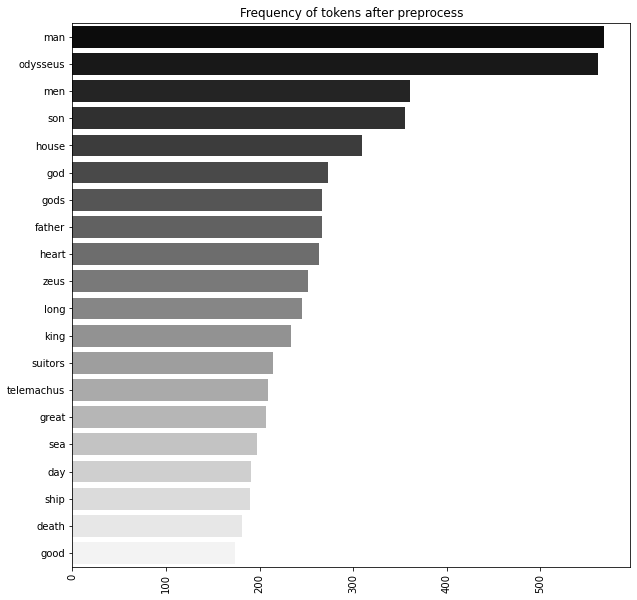

In [8]:
#And now , visualization
frequency_distribution = nltk.FreqDist(tokens_after_preprocess)
freq_dist_common = frequency_distribution.most_common(20)
print("30 most frequent words, after preproccess :\n\n ",freq_dist_common)

color = ['black','red','green','orange','blue','limegreen','darkgreen','royalblue','navy']



all_fdist = pd.Series(dict(freq_dist_common)) # convert to a pandas series for easier visualization.
fig, ax = plt.subplots(figsize=(10,10))
sns.set_palette("dark")
all_plot = sns.barplot(y=all_fdist.index, x=all_fdist.values, ax=ax,palette = 'gray' ).set(title='Frequency of tokens after preprocess') # use seaborn. 
plt.xticks(rotation=90);

#### Visualization with Lemmatized nouns and then Lemmatized nouns and verbs

30 most frequent lemmatized words, only noun lemmatized:

  [('man', 568), ('odysseus', 562), ('god', 540), ('son', 417), ('men', 361), ('house', 314), ('heart', 313), ('ship', 285), ('day', 282), ('hand', 273), ('father', 272), ('zeus', 252), ('king', 246), ('long', 245), ('suitor', 229), ('sea', 217), ('telemachus', 209), ('great', 207), ('good', 197), ('friend', 194)]


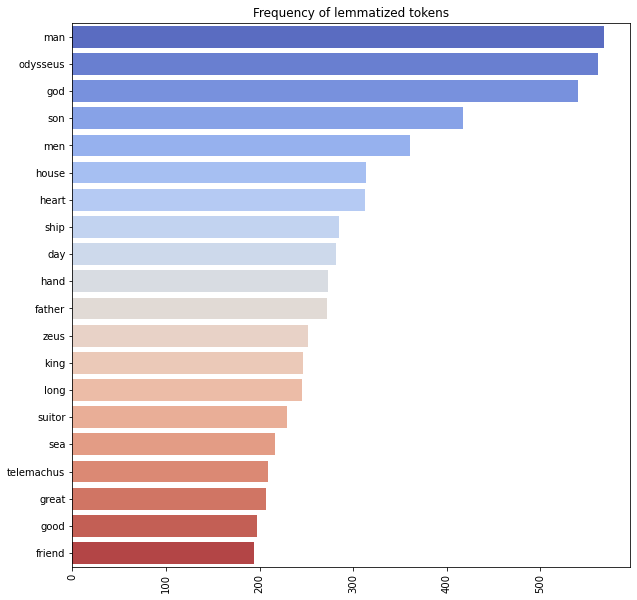

In [9]:
frequency_distribution = nltk.FreqDist(lemmatized_words)
freq_dist_common = frequency_distribution.most_common(20)
print("30 most frequent lemmatized words, only noun lemmatized:\n\n ",freq_dist_common)

all_fdist = pd.Series(dict(freq_dist_common)) # convert to a pandas series for easier visualization.
fig, ax = plt.subplots(figsize=(10,10))
all_plot = sns.barplot(y=all_fdist.index, x=all_fdist.values, ax=ax,palette = 'coolwarm').set(title='Frequency of lemmatized tokens') # use seaborn. 
plt.xticks(rotation=90);

30 most frequent lemmatized words, lemmatized by noun and verb :

  [('man', 570), ('odysseus', 562), ('god', 540), ('son', 417), ('men', 361), ('house', 314), ('heart', 313), ('ship', 296), ('hand', 286), ('day', 282), ('father', 275), ('long', 264), ('zeus', 252), ('king', 246), ('suitor', 229), ('sea', 217), ('telemachus', 209), ('great', 207), ('good', 197), ('friend', 194)]


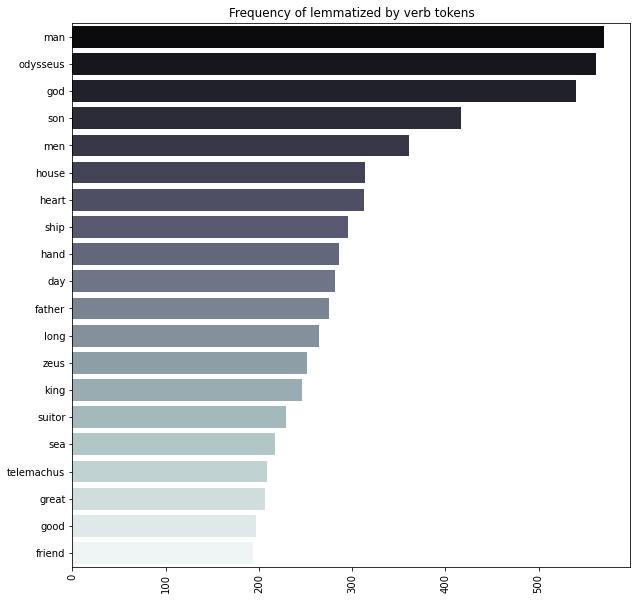

In [10]:
frequency_distribution = nltk.FreqDist(tokens_after_lemmatize)
freq_dist_common = frequency_distribution.most_common(20)
print("30 most frequent lemmatized words, lemmatized by noun and verb :\n\n ",freq_dist_common)

all_fdist = pd.Series(dict(freq_dist_common)) # convert to a pandas series for easier visualization.
fig, ax = plt.subplots(figsize=(10,10))
all_plot = sns.barplot(y=all_fdist.index, x=all_fdist.values, ax=ax, palette = 'bone').set(title='Frequency of lemmatized by verb tokens') # use seaborn. 
plt.xticks(rotation=90);

# Wordcloud on words after lemmatization

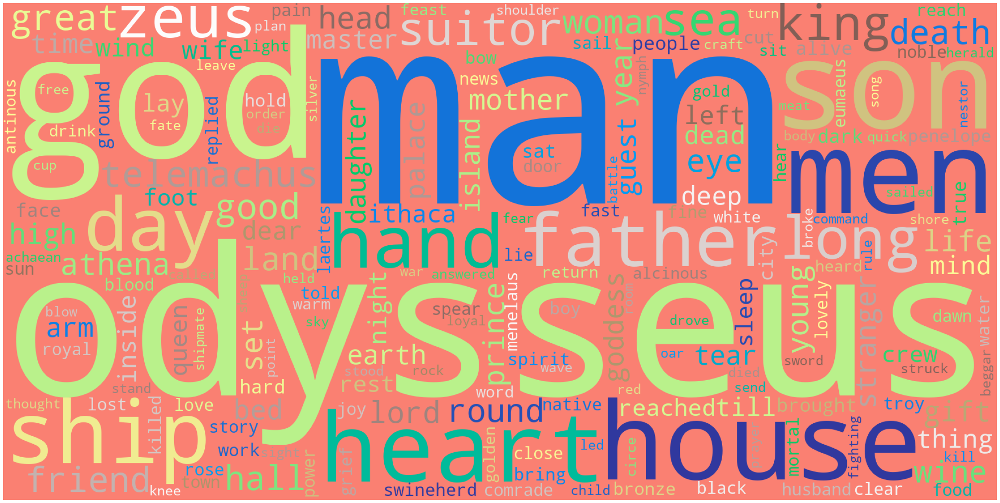

In [11]:
# Define a function to plot word cloud

def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");
       


# Wordcloud of Lemmatized tokens, only on nouns 
# Generate word cloud
wordcloud = WordCloud(width= 2000, height = 1000, random_state=1,
                      background_color='salmon', colormap='terrain', collocations=False).generate(" ".join(lemmatized_words))
# Plot

plot_cloud(wordcloud)

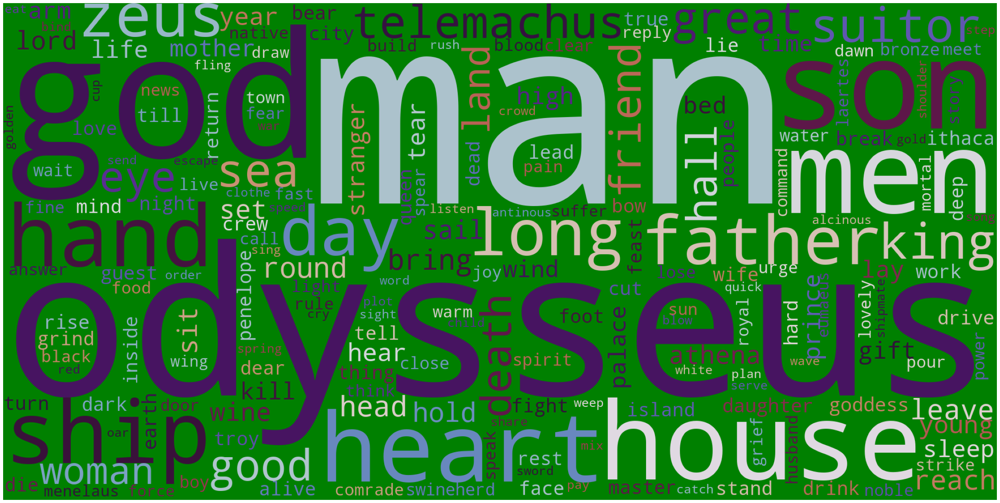

In [12]:
# wordcloud of lemamtized nouns and verbs
plot_cloud(WordCloud(width= 2000, height = 1000, random_state=1,
                      background_color='green', colormap='twilight', collocations=False).generate(" ".join(tokens_after_lemmatize)))


# Frequencies and Visualization of n-grams 

In [13]:
bigrams=list(ngrams(tokens_after_preprocess,2))
bigram_counts = collections.Counter(bigrams)
bigram_counts.most_common(30)

[(('great', 'odysseus'), 41),
 (('native', 'land'), 37),
 (('king', 'odysseus'), 36),
 (('years', 'ago'), 31),
 (('food', 'drink'), 30),
 (('dawn', 'rose'), 30),
 (('bright', 'eyed'), 25),
 (('house', 'death'), 23),
 (('heart', 'inside'), 22),
 (('rose', 'red'), 22),
 (('red', 'fingers'), 22),
 (('black', 'ship'), 22),
 (('deathless', 'gods'), 22),
 (('father', 'zeus'), 22),
 (('loyal', 'swineherd'), 22),
 (('fingers', 'shone'), 21),
 (('young', 'dawn'), 20),
 (('man', 'alive'), 20),
 (('prince', 'telemachus'), 19),
 (('son', 'laertes'), 19),
 (('eyed', 'goddess'), 18),
 (('son', 'odysseus'), 18),
 (('swift', 'ship'), 18),
 (('royal', 'son'), 18),
 (('father', 'son'), 16),
 (('gods', 'rule'), 16),
 (('pallas', 'athena'), 16),
 (('set', 'sail'), 16),
 (('young', 'men'), 15),
 (('red', 'haired'), 15)]

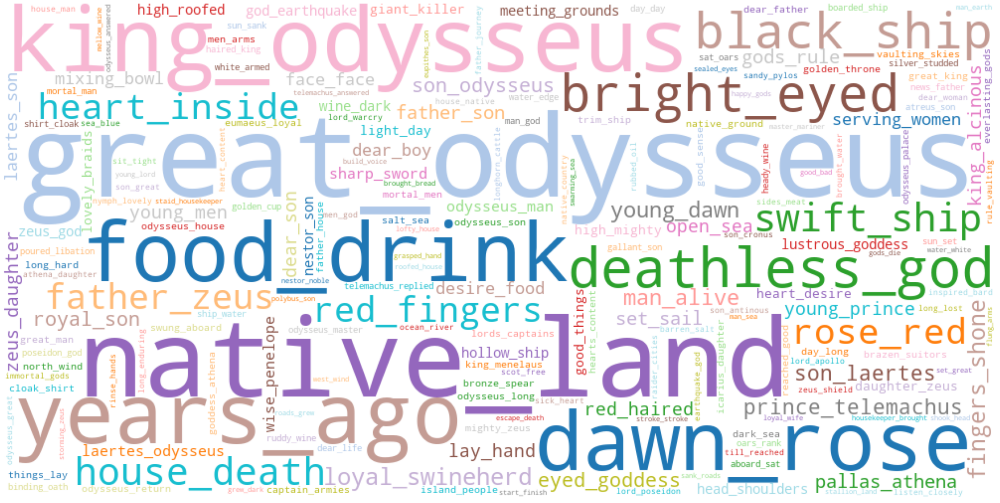

In [14]:
plot_cloud(WordCloud(width= 1000, height = 500, random_state=1,
                      background_color='white', colormap='tab20', collocations=False).generate(" ".join(map('_'.join, bigrams))))

In [15]:
trigrams=list(ngrams(tokens_after_preprocess,3))
trigram_counts = collections.Counter(trigrams)
trigram_counts.most_common(10)

[(('dawn', 'rose', 'red'), 22),
 (('rose', 'red', 'fingers'), 22),
 (('red', 'fingers', 'shone'), 21),
 (('young', 'dawn', 'rose'), 19),
 (('bright', 'eyed', 'goddess'), 17),
 (('desire', 'food', 'drink'), 14),
 (('royal', 'son', 'laertes'), 14),
 (('son', 'laertes', 'odysseus'), 14),
 (('wine', 'dark', 'sea'), 11),
 (('eumaeus', 'loyal', 'swineherd'), 11)]

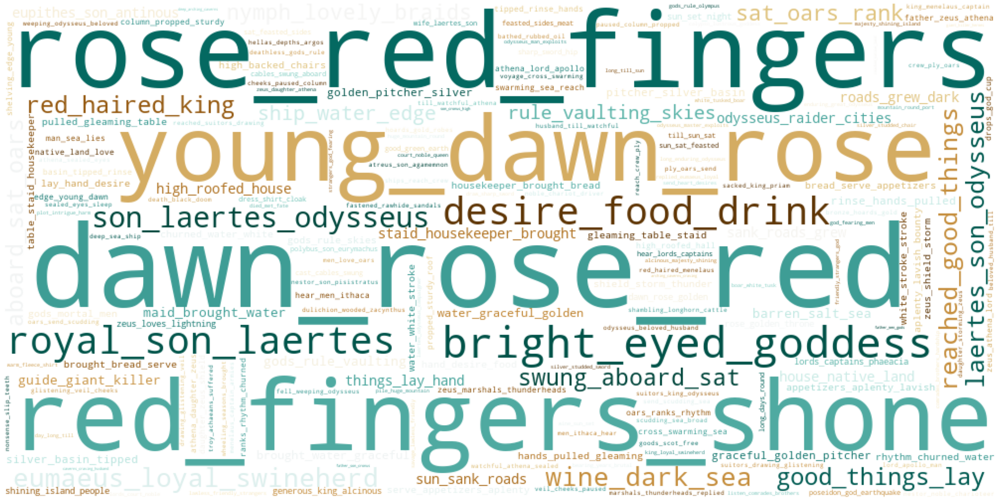

In [16]:
plot_cloud(WordCloud(width= 1000, height = 500, random_state=1,
                      background_color='white', colormap='BrBG', collocations=False).generate(" ".join(map('_'.join, trigrams))))

In [17]:
quadragrams=list(ngrams(tokens_after_preprocess,4))
quadragrams_counts = collections.Counter(quadragrams)
quadragrams_counts.most_common(10)

[(('dawn', 'rose', 'red', 'fingers'), 22),
 (('rose', 'red', 'fingers', 'shone'), 21),
 (('young', 'dawn', 'rose', 'red'), 19),
 (('royal', 'son', 'laertes', 'odysseus'), 14),
 (('reached', 'good', 'things', 'lay'), 9),
 (('swung', 'aboard', 'sat', 'oars'), 9),
 (('aboard', 'sat', 'oars', 'ranks'), 8),
 (('good', 'things', 'lay', 'hand'), 7),
 (('sun', 'sank', 'roads', 'grew'), 7),
 (('sank', 'roads', 'grew', 'dark'), 7)]

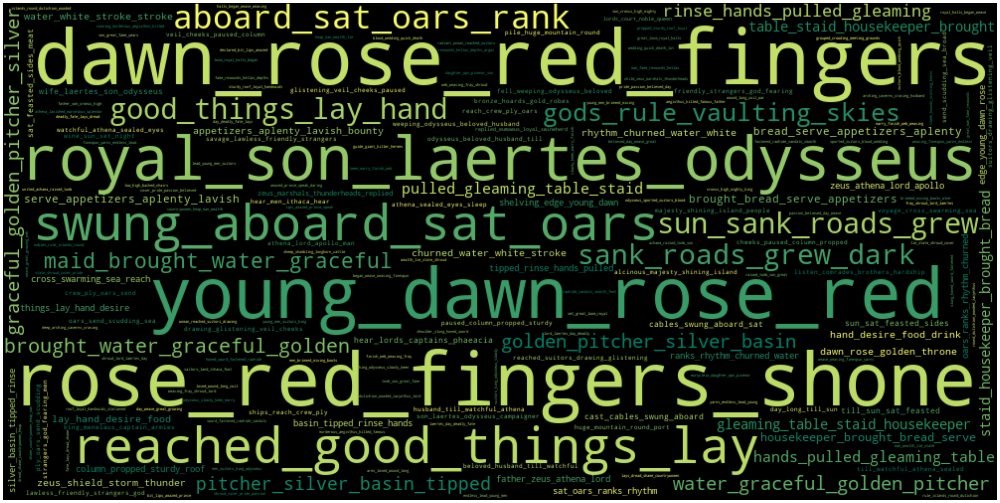

In [18]:
plot_cloud(WordCloud(width= 1000, height = 500, random_state=49,
                      background_color='black', colormap='summer', collocations=False).generate(" ".join(map('_'.join, quadragrams))))

In [19]:
pentagrams=list(ngrams(tokens_after_preprocess,5))
pentagrams_counts = collections.Counter(pentagrams)
pentagrams_counts.most_common(10)

[(('dawn', 'rose', 'red', 'fingers', 'shone'), 21),
 (('young', 'dawn', 'rose', 'red', 'fingers'), 19),
 (('swung', 'aboard', 'sat', 'oars', 'ranks'), 8),
 (('reached', 'good', 'things', 'lay', 'hand'), 7),
 (('sun', 'sank', 'roads', 'grew', 'dark'), 7),
 (('maid', 'brought', 'water', 'graceful', 'golden'), 6),
 (('brought', 'water', 'graceful', 'golden', 'pitcher'), 6),
 (('water', 'graceful', 'golden', 'pitcher', 'silver'), 6),
 (('graceful', 'golden', 'pitcher', 'silver', 'basin'), 6),
 (('golden', 'pitcher', 'silver', 'basin', 'tipped'), 6)]

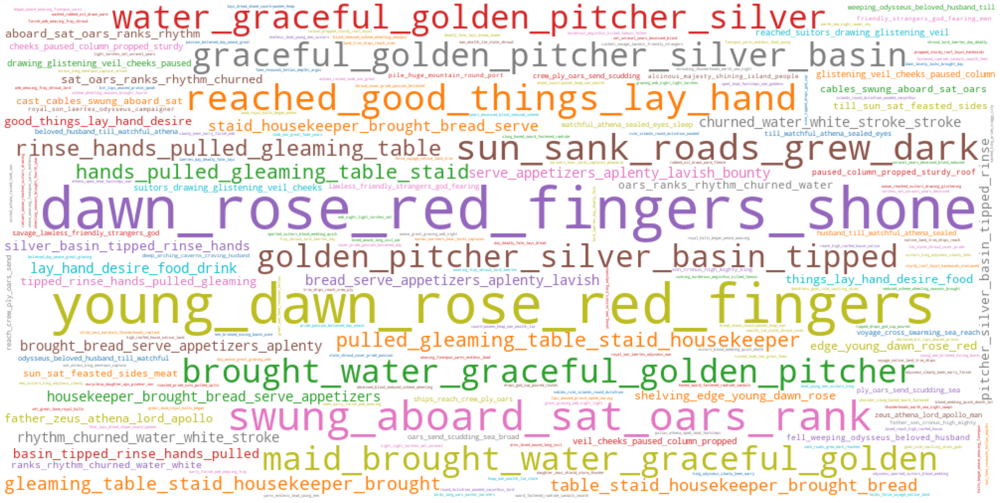

In [20]:
plot_cloud(WordCloud(width= 1000, height = 500, random_state=18,
                      background_color='white', colormap='tab10', collocations=False).generate(" ".join(map('_'.join, pentagrams))))

# NLTK : Sentence Tokenization - Word Tokenization - P.O.S. Tagging - Chunking - NER



In [21]:
#defining the function which splits the test paragraph into sentences, then tokenizes words in those sentences, then does POS in tokens.
def ie_preprocess(given_text):
    sentences = nltk.sent_tokenize(given_text)
    sentences = [nltk.word_tokenize(sent) for sent in sentences]
    sentences = [nltk.pos_tag(sent) for sent in sentences]
    return sentences

In [22]:
# Defining a test paragraph to test stuff!
test_para = 'Then Marcus Aurelius spoke, “Shameless,” he cried, “and insolent suitors,let us feast at our pleasure now, and let there be no brawling, for itis a rare thing to hear a man with such a divine voice as Phemius has;in the morning meet me in full assembly that I may give you formalnotice to depart, and feast at one another’s houses, turn and turnabout, at your own cost. If on the other hand you choose to persist inspunging upon one man, heaven help me, but Jove shall reckon with youin full, and when you fall in my father’s house in Ithaca there shall be no man to avenge you.'

In [23]:
#we save the function results(sent split ,tokenization, POS tag , into the variable sent_tag)
sent_tag = ie_preprocess(test_para)
print(sent_tag)

[[('Then', 'RB'), ('Marcus', 'NNP'), ('Aurelius', 'NNP'), ('spoke', 'VBD'), (',', ','), ('“', 'NNP'), ('Shameless', 'NNP'), (',', ','), ('”', 'NNP'), ('he', 'PRP'), ('cried', 'VBD'), (',', ','), ('“', 'NNP'), ('and', 'CC'), ('insolent', 'JJ'), ('suitors', 'NNS'), (',', ','), ('let', 'VB'), ('us', 'PRP'), ('feast', 'VB'), ('at', 'IN'), ('our', 'PRP$'), ('pleasure', 'NN'), ('now', 'RB'), (',', ','), ('and', 'CC'), ('let', 'VB'), ('there', 'EX'), ('be', 'VB'), ('no', 'DT'), ('brawling', 'NN'), (',', ','), ('for', 'IN'), ('itis', 'NN'), ('a', 'DT'), ('rare', 'JJ'), ('thing', 'NN'), ('to', 'TO'), ('hear', 'VB'), ('a', 'DT'), ('man', 'NN'), ('with', 'IN'), ('such', 'PDT'), ('a', 'DT'), ('divine', 'JJ'), ('voice', 'NN'), ('as', 'IN'), ('Phemius', 'NNP'), ('has', 'VBZ'), (';', ':'), ('in', 'IN'), ('the', 'DT'), ('morning', 'NN'), ('meet', 'NN'), ('me', 'PRP'), ('in', 'IN'), ('full', 'JJ'), ('assembly', 'NN'), ('that', 'IN'), ('I', 'PRP'), ('may', 'MD'), ('give', 'VB'), ('you', 'PRP'), ('formal

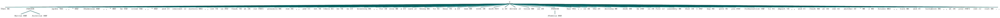

In [24]:
#and now we do the chunking 
chunk = nltk.ne_chunk(sent_tag[0]) 
chunk

In [25]:
# Printing the chunking(entity and pos) for our test paragraph. Sadly I cannot output just chunk , for some reason the tree does
# not show up when in the for loop . I can only print(chunk) but it does not visualize it with a tree.
for i in range(0,len(sent_tag)):
    chunk = nltk.ne_chunk(sent_tag[i])
    print(chunk)

(S
  Then/RB
  (PERSON Marcus/NNP Aurelius/NNP)
  spoke/VBD
  ,/,
  “/NNP
  Shameless/NNP
  ,/,
  ”/NNP
  he/PRP
  cried/VBD
  ,/,
  “/NNP
  and/CC
  insolent/JJ
  suitors/NNS
  ,/,
  let/VB
  us/PRP
  feast/VB
  at/IN
  our/PRP$
  pleasure/NN
  now/RB
  ,/,
  and/CC
  let/VB
  there/EX
  be/VB
  no/DT
  brawling/NN
  ,/,
  for/IN
  itis/NN
  a/DT
  rare/JJ
  thing/NN
  to/TO
  hear/VB
  a/DT
  man/NN
  with/IN
  such/PDT
  a/DT
  divine/JJ
  voice/NN
  as/IN
  (PERSON Phemius/NNP)
  has/VBZ
  ;/:
  in/IN
  the/DT
  morning/NN
  meet/NN
  me/PRP
  in/IN
  full/JJ
  assembly/NN
  that/IN
  I/PRP
  may/MD
  give/VB
  you/PRP
  formalnotice/VBP
  to/TO
  depart/VB
  ,/,
  and/CC
  feast/NN
  at/IN
  one/CD
  another/DT
  ’/NN
  s/NN
  houses/NNS
  ,/,
  turn/NN
  and/CC
  turnabout/NN
  ,/,
  at/IN
  your/PRP$
  own/JJ
  cost/NN
  ./.)
(S
  If/IN
  on/IN
  the/DT
  other/JJ
  hand/NN
  you/PRP
  choose/VBP
  to/TO
  persist/VB
  inspunging/VBG
  upon/IN
  one/CD
  man/NN
  ,/,
  heaven/RB

### With the code below I'm (trying) to save the labels of entities into a variable so I am able to look for them in sentences later( if location 3 sentences away from person etc.)

In [26]:
# Function to return lists of specific entity label.
from nltk import word_tokenize, pos_tag, ne_chunk
from nltk import Tree

def get_continuous_chunks(text, label):
    chunked = ne_chunk(pos_tag(word_tokenize(text)))
    prev = None
    continuous_chunk = []
    current_chunk = []

    for subtree in chunked:
        if type(subtree) == Tree and subtree.label() == label:
            current_chunk.append(" ".join([token for token, pos in subtree.leaves()]))
        if current_chunk:
            named_entity = " ".join(current_chunk)
            if named_entity not in continuous_chunk:
                continuous_chunk.append(named_entity)
                current_chunk = []
        else:
            continue

    return continuous_chunk

In [27]:
persons = get_continuous_chunks(test_para, 'PERSON')
locations = get_continuous_chunks(test_para, 'GPE')
print(persons,locations)
                            #works !

['Marcus Aurelius', 'Phemius', 'Jove'] ['Ithaca']


# FLAIR NER



## First some testing on a sample paragraph

In [28]:
#import torch
#!pip install flair
#install necessary libraries for our work
from flair.data import Sentence
from flair.models import SequenceTagger
from flair.models import MultiTagger
# At first I used Sequence tagger , but why not use multitagger to have the POS too? Ill use MultiTagger for now .

tagger = MultiTagger.load(['pos', 'ner'])

#tagger = SequenceTagger.load('ner') # we want the NER tagget not the POS tagger . They are build in Sequene Tagger.


2022-05-24 22:50:55,782 loading file C:\Users\NatureChad\.flair\models\pos-english\a9a73f6cd878edce8a0fa518db76f441f1cc49c2525b2b4557af278ec2f0659e.121306ea62993d04cd1978398b68396931a39eb47754c8a06a87f325ea70ac63
2022-05-24 22:50:56,326 SequenceTagger predicts: Dictionary with 53 tags: <unk>, O, UH, ,, VBD, PRP, VB, PRP$, NN, RB, ., DT, JJ, VBP, VBG, IN, CD, NNS, NNP, WRB, VBZ, WDT, CC, TO, MD, VBN, WP, :, RP, EX, JJR, FW, XX, HYPH, POS, RBR, JJS, PDT, NNPS, RBS, AFX, WP$, -LRB-, -RRB-, ``, '', LS, $, SYM, ADD
2022-05-24 22:51:05,097 loading file C:\Users\NatureChad\.flair\models\ner-english\4f4cdab26f24cb98b732b389e6cebc646c36f54cfd6e0b7d3b90b25656e4262f.8baa8ae8795f4df80b28e7f7b61d788ecbb057d1dc85aacb316f1bd02837a4a4
2022-05-24 22:51:15,121 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


In [29]:
from segtok.segmenter import split_single

# split sentences and tokenize them at the same time for the given text
test_sentences = [Sentence(sent, use_tokenizer=True) for sent in split_single(test_para)]
test_sentences

[Sentence: "Then Marcus Aurelius spoke , “ Shameless ,” he cried , “ and insolent suitors,let us feast at our pleasure now , and let there be no brawling , for itis a rare thing to hear a man with such a divine voice as Phemius has ; in the morning meet me in full assembly that I may give you formalnotice to depart , and feast at one another ’s houses , turn and turnabout , at your own cost .",
 Sentence: "If on the other hand you choose to persist inspunging upon one man , heaven help me , but Jove shall reckon with youin full , and when you fall in my father ’s house in Ithaca there shall be no man to avenge you ."]

In [30]:
#tags our tokens with POS tags and our looks for entities with NER
tagger.predict(test_sentences)
#out puts our results
for sentence in test_sentences:
    print(sentence)

Sentence: "Then Marcus Aurelius spoke , “ Shameless ,” he cried , “ and insolent suitors,let us feast at our pleasure now , and let there be no brawling , for itis a rare thing to hear a man with such a divine voice as Phemius has ; in the morning meet me in full assembly that I may give you formalnotice to depart , and feast at one another ’s houses , turn and turnabout , at your own cost ." → ["Then"/RB, "Marcus"/NNP, "Marcus Aurelius"/PER, "Aurelius"/NNP, "spoke"/VBD, ","/,, "“"/``, "Shameless"/JJ, "Shameless"/PER, ",”"/,, "he"/PRP, "cried"/VBD, ","/,, "“"/``, "and"/CC, "insolent"/JJ, "suitors,let"/NN, "us"/PRP, "feast"/NN, "at"/IN, "our"/PRP$, "pleasure"/NN, "now"/RB, ","/,, "and"/CC, "let"/VB, "there"/EX, "be"/VB, "no"/DT, "brawling"/NN, ","/,, "for"/IN, "itis"/PRP, "a"/DT, "rare"/JJ, "thing"/NN, "to"/TO, "hear"/VB, "a"/DT, "man"/NN, "with"/IN, "such"/PDT, "a"/DT, "divine"/JJ, "voice"/NN, "as"/IN, "Phemius"/NNP, "Phemius"/PER, "has"/VBZ, ";"/:, "in"/IN, "the"/DT, "morning"/NN, "me

In [31]:
#Output Entities.
for sent in test_sentences:
    for entity in sent.get_labels('ner'):
        print(entity)

Span[1:3]: "Marcus Aurelius" → PER (0.9988)
Span[6:7]: "Shameless" → PER (0.6435)
Span[44:45]: "Phemius" → PER (0.5846)
Span[19:20]: "Jove" → PER (0.9985)
Span[36:37]: "Ithaca" → LOC (0.9998)


# Actual code from now on 

In [32]:
def chunk(k,x):
    if type(x) == np.ndarray:
        N = x.shape[0]
    else:
        N = len(x)
    n_chunk = np.ceil(N/k)
    chunks = list()
    for chnk_num in range(k):
        hi_id_prop = n_chunk*(chnk_num+1)
        hi_index = np.min([N-1,hi_id_prop])
        chunk = x[int(n_chunk*chnk_num):int(hi_index)]
        chunks.append(chunk)
    return chunks

# function to chunk the book into pieces so it is proccesable by the NER predictor.

In [33]:
book_chunked = chunk(10 , nltk.sent_tokenize(book_raw))
book_chunked[0] 
# chunked the book in 10 roughly equal sizes.

['\x0cBook I\n\n\nAthena Inspires\nthe Prince\n\n\nSing to me of the man, Muse, the man of twists and turns …\ndriven time and again off course, once he had plundered\nthe hallowed heights of Troy.',
 'Many cities of men he saw and learned their minds,\nmany pains he suffered, heartsick on the open sea,\nfighting to save his life and bring his comrades home.',
 'But he could not save them from disaster, hard as he strove—\nthe recklessness of their own ways destroyed them all,\nthe blind fools, they devoured the cattle of the Sun\nand the Sungod blotted out the day of their return.',
 'Launch out on his story, Muse, daughter of Zeus,\nstart from where you will—sing for our time too.',
 'By now,\nall the survivors, all who avoided headlong death\nwere safe at home, escaped the wars and waves.',
 'But one man alone …\nhis heart set on his wife and his return—Calypso,\nthe bewitching nymph, the lustrous goddess, held him back,\ndeep in her arching caverns, craving him for a husband.',
 'B

In [34]:
#load the NER tagger

tagger = SequenceTagger.load('ner')

#split into sentences using Sentence

trial_sentences = [Sentence(sent) for sent in book_chunked[0]]

#tag the sentences of book_chunked[0]

def predicted_sentence(sent):
    tagger.predict(sent)
    return sent

trial_sentences_tagged = [predicted_sentence(sent) for sent in trial_sentences]
print(trial_sentences_tagged)

2022-05-24 22:51:19,997 loading file C:\Users\NatureChad\.flair\models\ner-english\4f4cdab26f24cb98b732b389e6cebc646c36f54cfd6e0b7d3b90b25656e4262f.8baa8ae8795f4df80b28e7f7b61d788ecbb057d1dc85aacb316f1bd02837a4a4
2022-05-24 22:51:30,329 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>
[Sentence: "Book I Athena Inspires the Prince Sing to me of the man , Muse , the man of twists and turns … driven time and again off course , once he had plundered the hallowed heights of Troy ." → ["Athena Inspires"/MISC, "Muse"/PER, "Troy"/LOC], Sentence: "Many cities of men he saw and learned their minds , many pains he suffered , heartsick on the open sea , fighting to save his life and bring his comrades home .", Sentence: "But he could not save them from disaster , hard as he strove — the recklessness of their own ways destroyed them all , the blind fools , t

In [35]:
offset = 0

In [36]:
# 2 classes : Person and Locations
# A function that gives me occurance of person and location without a specific number of token distance

import copy

class Person:
    name = ""
    locations = list()
    
    def __init__(self,name):
        self.name = name
        
    def __repr__(self):
        ret_string = "Entity \"" + self.name + "\" occurs at "
        for loc in self.locations:
            ret_string += str(loc) + ", "
        return ret_string
    
    def copy(self):
        nm = copy.deepcopy(self.name)
        locs = [loc for loc in self.locations]
        pers = Person(nm)
        pers.locations = copy.deepcopy(locs)
        return pers

class Location:
    name = ""
    token_id = None
    
    def __init__(self,nm,tid):
        self.name = copy.deepcopy(nm)
        self.token_id = copy.deepcopy(tid)
        
    def __str__(self):
        return self.name + " (" + str(self.token_id) + ")"
        
    def __repr__(self):
        return self.name + " (" + str(self.token_id) + ")"




def get_entities(sentences,token_distance_tolerance,token_offset=0):
    tolerance = token_distance_tolerance
    persons = dict()
    locations = dict()
    token_index = 0
    for sent in sentences:
        pers = [ent.text for ent in sent.get_spans('ner') if ent.tag == "PER"]
        locs = [ent.text for ent in sent.get_spans('ner') if ent.tag == "LOC"]
        for entity in pers:
            if entity.replace('’','') not in persons.keys():
                persons.update({entity.replace('’',''):list()})
        for token in sent.tokens:
            if token.text.replace('’','') in pers:
                persons[token.text.replace('’','')].append(token_index+offset)
            if token.text.replace('’','') in locs:
                locations.update({(token_index+offset):token.text.replace('’','')})
            token_index += 1

    ret_array = list()
    for person in persons.keys():
        per = Person(person)
        per.locations.clear()
        occurence_id = 0
        occ_list = persons[person]
        loc_keys = list(locations.keys())
        loc_id = 0
        while occurence_id < len(occ_list):
            occurence_token = occ_list[occurence_id]
            print("Checking if " + person + ", token id: " + str(occ_list[occurence_id]) + " is at " + locations[loc_keys[loc_id]] + ", token id: " + str(loc_keys[loc_id]))
            if np.abs(occurence_token - loc_keys[loc_id]) <= tolerance:
                per.locations.append(Location(locations[loc_keys[loc_id]],loc_keys[loc_id]))
                loc_id += 1
            elif occurence_token - loc_keys[loc_id] < 0:
                occurence_id += 1
            else:
                loc_id += 1
            if loc_id > len(loc_keys)-1:
                occurence_id = len(occ_list)
            
        ret_array.append(per.copy())
        
    return ret_array, token_index

In [ ]:
# Loading the tagger, along with creating 2 functions ,one to predict/tag and the other to return tagged sentences by chunks.

tagger = SequenceTagger.load('ner')

def predicted_sentence(sent):
    tagger.predict(sent)
    return sent

def make_sentences(chunk):
    trial_sents = [Sentence(sent) for sent in chunk]
    return [predicted_sentence(sent) for sent in trial_sents]

sentence_chunks = list(map(make_sentences,book_chunked))

2022-05-24 22:52:21,236 loading file C:\Users\NatureChad\.flair\models\ner-english\4f4cdab26f24cb98b732b389e6cebc646c36f54cfd6e0b7d3b90b25656e4262f.8baa8ae8795f4df80b28e7f7b61d788ecbb057d1dc85aacb316f1bd02837a4a4
2022-05-24 22:52:23,611 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


# Event Detection 

## Who - Where

In [ ]:
entities_chunks = list()
offset = 0
for chunk in sentence_chunks:
    entities, offset_ = get_entities(chunk,40,offset)
    offset += offset_
    entities_chunks.append(entities)


In [ ]:
# entities_chunks works the same way as entities, just that it has every characer for every chunk .
# It's a list of lists of Persons with property locations and property name
entities_chunks[0][0].locations

In [ ]:
entities_chunks

In [ ]:
# To extract a PERSON or a LOCATION , you do the following :
# Entities is a list , so you choose first the element you want , and then you have the PERSON class.
# To get the location ,it's a property of the class so you use .locations to get it .
entities[1].locations

## Printing of all events ( Persons occuring in locations ) thorought the whole book below :

In [ ]:
for i,ents in enumerate(entities_chunks):
    print("CHUNK " + str(i) + "--------------------------")
    for ent in ents:
        print(ent)

### Why Troy is tagged as a Person?  Let's check.

In [ ]:
# Interesting tokens to look for : sun , troy, menelaus among others.

entities_chunks[0][40].name

In [ ]:
# Searching for a specific Index to check nearby sentences.
# Here , we are looking at indexes where Troy is considered a PERSON , to understand why the algorithm tags it so.
# There are 3 occurences of Troy as a Person , so we must check them all within some range of tokens.
token_id = 0
for sent in sentence_chunks[0]:
    token_id += len(sent.tokens)
    if(token_id > 11550 and token_id < 11650):
        print(sent)

#### 'fought with you to demolish Troy some years ago' the algorithm seems to understand from context that Troy is a Person
#### seems like the word demolish does not specify a location necesarily.

## List of Persons and Locations in the book

In [ ]:
# A list of all Person entities found in the book.

psns = [ent.name for chunk in entities_chunks for ent in chunk]
print(np.sort(list(set(psns))))

In [ ]:
#A list of all locations found in the book.

all_locations_with_char_occ = []
for chunk in entities_chunks:
    for l in chunk:
        if len(l.locations) != 0: 
            all_locations_with_char_occ.append(l.locations)
print(all_locations_with_char_occ)

### EDA on locations

In [ ]:
list_of_entities=[]
for chunk in sentence_chunks:
    for sent in chunk:
        for label in sent.get_labels():
            list_of_entities.append(label)

In [ ]:
list_of_entities

In [ ]:
list_of_locations

In [ ]:
list_of_locations=[]
for loc in list_of_entities:
    if loc.value =='LOC':
        list_of_locations.append(loc.data_point.text.replace("’",""))

#list_of_locations = list(set(list_of_locations))
list_of_locations

locations_freq=Counter(list_of_locations)
locations_freq


In [ ]:
frequency_distribution = nltk.FreqDist(list_of_locations)
freq_dist_common = frequency_distribution.most_common(10)
print("Most mentioned locations:\n\n ",freq_dist_common)

all_fdist = pd.Series(dict(freq_dist_common)) # convert to a pandas series for easier visualization.
fig, ax = plt.subplots(figsize=(10,10))
all_plot = sns.barplot(y=all_fdist.index, x=all_fdist.values, ax=ax, palette = 'pink').set(title="Homer's Odyssey Locations")
plt.xticks(rotation=90);

## EDA on Persons 

In [ ]:
list_of_persons=[]
for loc in list_of_entities:
    if loc.value =='PER':
        list_of_persons.append(loc.data_point.text.replace("’","").replace("Pallas","Athena").replace("Athena Athena","Athena"))

list_of_persons

In [ ]:
persons_freq = Counter(list_of_persons)
persons_freq

In [ ]:
frequency_distribution = nltk.FreqDist(list_of_persons)
freq_dist_common = frequency_distribution.most_common(10)
print("12 Most frequent Odyssey Characters :\n\n ",freq_dist_common)

all_fdist = pd.Series(dict(freq_dist_common)) # convert to a pandas series for easier visualization.
fig, ax = plt.subplots(figsize=(10,10))
all_plot = sns.barplot(y=all_fdist.index, x=all_fdist.values, ax=ax, palette = 'cool').set(title="Main Characters of Homer's Odyssey") # use seaborn. 
plt.xticks(rotation=90);

## Relation Extraction

In [ ]:
extractor: RelationExtractor = RelationExtractor.load('relations')

for chunk in sentence_chunks:
    extractor.predict(chunk)

relations_lis=[]

for sent_chunk in sentence_chunks:
    for sent in sent_chunk:
        for relation in sent.get_labels('relation'):
            relations_lis.append(relation)



In [ ]:
relations_lis

## EDA on relations

In [ ]:
parents_list=[]
for lis in relations_lis:
    if lis.data_point.tag == 'parent_of':
        parents_list.append(lis.data_point.text.split(" ")[0].replace("’",""))
parents_list

In [ ]:
parents_freq = Counter(parents_list)
parents_freq

In [ ]:
frequency_distribution = nltk.FreqDist(parents_list)
freq_dist_common = frequency_distribution.most_common(13)
print("30 most frequent lemmatized words, lemmatized by noun and verb :\n\n ",freq_dist_common)

all_fdist = pd.Series(dict(freq_dist_common))
fig, ax = plt.subplots(figsize=(10,10))
all_plot = sns.barplot(y=all_fdist.index, x=all_fdist.values, ax=ax, palette = 'gist_stern').set(title="Most frequently mentioned parent") 
plt.xticks(rotation=90);

In [ ]:
child_list=[]
for lis in relations_lis:
    if lis.data_point.tag == 'child_of':
        child_list.append(lis.data_point.text.split(" ")[0].replace("’","").replace("Pallas","Athena"))
child_list

In [ ]:
child_freq = Counter(child_list)
child_freq

In [ ]:
frequency_distribution = nltk.FreqDist(child_list)
freq_dist_common = frequency_distribution.most_common(20)
print("30 most frequent lemmatized words, lemmatized by noun and verb :\n\n ",freq_dist_common)

all_fdist = pd.Series(dict(freq_dist_common))
fig, ax = plt.subplots(figsize=(10,10))
all_plot = sns.barplot(y=all_fdist.index, x=all_fdist.values, ax=ax, palette = 'brg').set(title="Most famous child") 
plt.xticks(rotation=90);

 #                                  Map of travels - Interactive

In [ ]:
!pip install plotly
#https://medium.com/swlh/interactive-animated-travel-data-visualizations-mapping-nba-travel-a154a2e7c18d

In [ ]:
import plotly.graph_objects as go
import plotly.express as px
fig = go.Figure()

In [ ]:
data = {'Location':['Ithaca','Troy','Phaeacia','Ilus','Ephyra'], 'Latitude':[38.439628028920325,39.97075980456152,39.61554327420847,39.25999360400586,39.312541561837214],'Longtitude':[20.65679212724624 , 26.194736642348154, 19.85645119156481, 26.10564940088641, 20.367887384245922]}

location_dict = dict()
location_dict.update({'Ithaca':(38.439628028920325,20.65679212724624)})
location_dict.update({'Troy':(39.97075980456152,26.194736642348154)})
location_dict.update({'Phaeacia':(39.61554327420847,19.85645119156481)})
location_dict.update({'Lesbos':(39.25999360400586,26.10564940088641)})
location_dict.update({'Ephyra':(39.312541561837214,20.367887384245922)})
location_dict.update({'Argos':(37.626931158197955, 22.72414161836322)})
location_dict.update({'Pylos':(36.91180624364626, 21.703784759012542)})
location_dict.update({'Malea':(36.44181109942013, 23.190400559617625)})
location_dict.update({'Egypt':(30.973617400895638, 30.496138716420877)})
location_dict.update({'Nile':(30.167898367318127, 31.14297553998664)})
location_dict.update({'Sounion':(37.66179461347308, 24.017147216088652)})
location_dict.update({'Sparta':(37.09246037084445, 22.443439016251507)})
location_dict.update({'Crete':(35.20621095955759, 24.906738735735896)})
location_dict.update({'Athens':(37.972471645177535, 23.716839014472672)})
location_dict.update({'Gyrae':(38.099123977865176, 24.56970840486796)})
location_dict.update({'Pherae':(39.38183592927223, 22.86833283547426)})
location_dict.update({'Sidon':(33.60824348138113, 35.57158235636241)})
location_dict.update({'Scheria':(39.74872088747899, 19.686605394443898)})
location_dict.update({'Solymi':(37.06292753140335, 30.58296816549933)})
location_dict.update({'Marathon':(38.150948023852166, 23.953553903406206)})
location_dict.update({'Olympus':(40.10695966690441, 22.328000073107983)})
location_dict.update({'Ismarus':(40.89882366618044, 25.485893356124844)})
location_dict.update({'Thebes':(38.33863844240493, 23.349320270748336)})
location_dict.update({'Iolcos':(39.363385894130005, 22.980627320139682)})
location_dict.update({'Thrinacia':(35.898265563617166, 14.412215345393948)})
location_dict.update({'Dulichion':(38.12452677900957, 20.58205937825444)})
location_dict.update({'Piraeus':(37.941947832757904, 23.654299620698957)})
location_dict.update({'Ogygia':(39.85179108322027, 19.403747005441943)})
location_dict.update({'Aeaea':(40.90523383471134, 12.955104009238157)})
location_dict.update({'Hellespont':(40.39406575271379, 26.837564996576663)})
location_dict.update({'Scylla and Charybdes':(38.235093757127515, 15.635110251458102)})
location_dict.update({'Land of the Lotus Eaters':(33.78975471968134, 10.876905424806738)})
location_dict.update({'Island of the Cyclops':(37.76480633048486, 15.202635118617847)})




def occurence_table(name,chunked_entities):
    loc_ids = list()
    persons = list()
    locs = list()
    lats = list()
    longs = list()
    for chunk in chunked_entities:
        for ent in chunk:
            if ent.name == name:
                for loc in ent.locations:
                    try:
                        location_dict[loc.name]
                        loc_ids.append(loc.token_id)
                        persons.append(name)
                        locs.append(loc.name)
                        lat, long = location_dict[loc.name]
                        longs.append(long)
                        lats.append(lat)
                        df.append(pd.DataFrame([location_index,person,location,long,lat]))
                        print(long,lat)
                    except:
                        print(loc.name + " not in location dict.")
                break
    return pd.DataFrame(list(zip(loc_ids,persons,locs,lats,longs)),columns=['Location_Index','Person','Location','lat','long'])

In [ ]:
names = list()
for chunk in entities_chunks:
    for person in chunk:
        names.append(person.name)

names = np.sort(list(set(names)))
schedule_df = pd.DataFrame()
schedules = dict()
for name in names:
    occtab = occurence_table(name,entities_chunks)
    schedule_df = schedule_df.append(occtab)
    schedules.update({name:occtab})

In [ ]:
schedules

In [ ]:
location_dict

In [ ]:
schedule_df

In [ ]:
import math
travel_data_list = list()
for person in schedule_df.Person.unique():
    person_sch = schedule_df[schedule_df.Person==person]
    person_sch = person_sch.assign(dist=0)
    person_sch.reset_index(drop=True, inplace=True)
    for i, row in person_sch.iterrows():
        if i > 0:
            avg_lat = (row['lat'] + person_sch.iloc[i-1]['lat']) / 2
            lon_conv = math.cos(math.radians(avg_lat))
            lat1_rad = math.radians(person_sch.iloc[i-1]['lat'])
            lat2_rad = math.radians(row['lat'])
            lat_dist = math.radians(row['lat'] - person_sch.iloc[i-1]['lat'])
            lon_dist = math.radians(row['long'] - person_sch.iloc[i-1]['long'])
            temp_var = (
                    (math.sin(lat_dist/2) * math.sin(lat_dist/2)) +
                    (math.cos(lat1_rad) * math.cos(lat2_rad)) *
                    (math.sin(lon_dist/2) * math.sin(lon_dist/2))
            )
            temp_var2 = (
                2 * math.atan2(math.sqrt(temp_var), math.sqrt(1-temp_var))
            )
            tot_dist = 6371e3 * temp_var2 / 1000
        
            if tot_dist > 0:
                travel_data_list.append(dict(
                    Location_Index=int(row['Location_Index']),
                    person=person,
                    travel_dist=tot_dist,
                    orig_lat=person_sch.iloc[i-1]['lat'],
                    orig_lon=person_sch.iloc[i - 1]['long'],
                    dest_lat=row['lat'],
                    dest_lon=row['long']))

travel_df = pd.DataFrame(travel_data_list)
      
# print(travel_df)

travel_team_df = pd.DataFrame(travel_df.groupby('person')['travel_dist'].sum())
travel_team_df = travel_team_df.assign(trips=travel_df.groupby('person')['travel_dist'].count())
travel_team_df = travel_team_df.assign(km_per_trip=travel_team_df.travel_dist / travel_team_df.trips)
travel_team_df.reset_index(inplace=True)
travel_team_df = travel_team_df.assign(person=travel_team_df.person.str.replace('_', ' ').str.title())
print(travel_team_df)

In [ ]:
travel_df

In [ ]:
def clean_chart_format(fig, namelocs=(0.9, 0.02)):

    import plotly.graph_objects as go

    fig.update_layout(
        paper_bgcolor="white",
        plot_bgcolor="white",
        annotations=[
            go.layout.Annotation(
                x=namelocs[0],
                y=namelocs[1],
                showarrow=False,
                text="Athanasios Rakitzis i6302227",
                xref="paper",
                yref="paper",
                textangle=0
            ),
        ],
    )
    fig.update_traces(marker=dict(line=dict(width=1, color='Navy')),
                      selector=dict(mode='markers'))
    fig.update_traces(marker=dict(line=dict(color='navy')))
    fig.update_coloraxes(
        colorbar=dict(
            thicknessmode="pixels", thickness=15,
            outlinewidth=1,
            outlinecolor='#909090',
            lenmode="pixels", len=300,
            yanchor="top",
            y=1,
        ))
    fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='LightGray')
    fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='LightGray')
    return True


## Total travel distance by entity 

In [ ]:
fig = px.bar(
    travel_team_df.sort_values('travel_dist'), x='travel_dist', y='person', orientation='h',
    labels={'person': 'Character', 'travel_dist': 'Total distance (km)', 'km_per_trip': 'km/trip'},
    color='km_per_trip', color_continuous_scale=px.colors.sequential.GnBu, hover_name='person')
clean_chart_format(fig)
fig.update_layout(title="Total travelled distances - Homer's Odyssey Characters ")
fig.show()

### Funny , Zeus is the most travelled character !   Same with Mycynae. These names are ancient and their context around them is not very easy to decipher

In [ ]:
fig = px.scatter(
    travel_team_df.sort_values('travel_dist'), x='travel_dist', y='person',
    labels={'person': 'Character', 'travel_dist': 'Total distance (km)', 'km_per_trip': 'km/trip'},
    color='km_per_trip', color_continuous_scale=px.colors.sequential.GnBu, hover_name='person')
clean_chart_format(fig, namelocs=[0.9, 0.1])
fig.update_layout(title="Total travelled distances - Homer's Odyssey Characters")
fig.show()

In [ ]:
location_dict

names = list()
lats = list()
longs = list()
for key in location_dict.keys():
    lt,lng = location_dict[key]
    names.append(key)
    lats.append(lt)
    longs.append(lng)

occurences =[]
for loc in names:
    occurences.append(locations_freq[loc]+1)
occurences    
df = pd.DataFrame({'Location':names,'Latitude':lats,'Longitude':longs,'Count':occurences})

In [ ]:
df

In [ ]:
import plotly.express as px
fig = px.scatter_mapbox(df, lat="Latitude", lon="Longitude", zoom=5, hover_name='Location',size='Count')
fig.update_layout(mapbox_style="open-street-map")  # <== Using Mapbox
fig.show()

In [ ]:
import plotly.graph_objects as go

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scattergeo(
    lon=df['Longitude'], lat=df['Latitude'], marker=dict(size=8, color='slategray'),
    hoverinfo='text', text=df['Location'], name='Areas'
))
fig.update_layout(width = 1000, height=1000,
        title_text = 'Locations of Odyssey',title_x=0.5,
        showlegend = True,
        geo = dict(
            scope = 'world',
            resolution = 50,
            fitbounds = 'locations',
            landcolor = 'rgb(217, 217, 217)',
        )
    )
fig.show()


### Regular map

In [ ]:
fig = go.Figure()

fig.add_trace(go.Scattergeo(
    lon=df['Longitude'], lat=df['Latitude'], marker=dict(size=8, color='slategray'),
    hoverinfo='text', text=df['Location'], name='Areas'
))

for person in travel_df.person.unique():
   
    travel_team_df = travel_df[travel_df.person == person]
    team_col = 'rgb(' + str(np.random.choice(range(256))) + ',' + str(np.random.choice(range(256))) + ',' + str(np.random.choice(range(256))) + ')'

    fig.add_trace(go.Scattergeo(
        locationmode='ISO-3', mode="lines",
        lon=np.append(travel_team_df['orig_lon'].values, travel_team_df['dest_lon'].values[-1]),
        lat=np.append(travel_team_df['orig_lat'].values, travel_team_df['dest_lat'].values[-1]),
        line=dict(width=1, color=team_col), opacity=0.8,
        hoverinfo='none', name=person
    ))
    
fig


In [ ]:
fig['data'][0]['marker']['symbol'] = 'triangle-left'

fig['data'][1]['marker']['symbol'] = 'triangle-left'
fig.update_layout(
    title_text='Travel paths',width=800,height=800,title_x=0.5,
    geo=dict(
        scope='world',
        projection_type='azimuthal equal area',
        showland=True,landcolor = "#F0DC82",
        showcoastlines=True,coastlinecolor="RebeccaPurple",
        showocean=True,oceancolor='LightBlue',
        fitbounds='locations',
        resolution=50,
        countrycolor='rgb(204, 204, 204)',
    ),
)
fig.show()

## Animation for all entities

In [ ]:
lon_vals = np.append(travel_df['orig_lon'].values, travel_df['dest_lon'].values[-1])
lat_vals = np.append(travel_df['orig_lat'].values, travel_df['dest_lat'].values[-1])

frames = list()
lon_data = np.array(lon_vals[0])
lat_data = np.array(lat_vals[0])

color_dict = dict()

for person in travel_df['person'].unique():
    random_color ='rgb(' + str(np.random.choice(range(256))) + ',' + str(np.random.choice(range(256))) + ',' + str(np.random.choice(range(256))) + ')'
    color_dict.update({person:random_color})


for i in range(len(lon_vals)):
    index = i if i < len(lon_vals)-1 else i-1
    frames.append(
        go.Frame(data=[go.Scattergeo(lon=lon_data, lat=lat_data,
                                     hoverinfo='none',name=travel_df['person'][index],
                                     line=dict(width=1, color=color_dict[travel_df['person'][index]]))])
    )
    lon_data = np.append(lon_data, lon_vals[i])
    lat_data = np.append(lat_data, lat_vals[i])

In [ ]:
frames

In [ ]:
fig = go.Figure(
    data=[
        go.Scattergeo(
            locationmode='ISO-3', mode="lines",
            lon=np.append(lon_vals[0], lon_vals[0]),
            lat=np.append(lat_vals[0], lat_vals[0]),
            line=dict(width=1.5, color="red"), opacity=1,
            hoverinfo='none', name=""
        )
    ],
    layout=go.Layout(
        title="Start Title",
        updatemenus=[dict(
            type="buttons",
            
            buttons=[dict(label="Play", method="animate", args=[None])])]
    ),
    frames=frames
)
fig.add_trace(go.Scattergeo(
    lon=df['Longitude'], lat=df['Latitude'], marker=dict(size=8, color='#000000'),
    hoverinfo='text', text=df['Location'], name='Area'
))

fig['data'][1]['marker']['symbol'] = 'triangle-left'
fig.update_layout(
    title_text='Animated travel paths of all characters',width=1000,height=1000,title_x=0.5,
    geo=dict(
        scope='world',
        projection_type='mercator',
        showland=True,landcolor = "#F0DC82",
        showcoastlines=True,coastlinecolor="gray",
        showocean=True,oceancolor='LightBlue',
        fitbounds='locations',
        resolution=50,
        countrycolor='rgb(204, 204, 204)',
    ),
)
fig.show()

## Animated map for one person - Insert name at the start of the cell

In [ ]:
# insert person's name you desire below 

person = 'Odysseus'

travel_team_df = travel_df[travel_df.person == person]



lon_vals = np.append(travel_team_df['orig_lon'].values, travel_team_df['dest_lon'].values[-1])
lat_vals = np.append(travel_team_df['orig_lat'].values, travel_team_df['dest_lat'].values[-1])

frames = list()
lon_data = np.array(lon_vals[0])
lat_data = np.array(lat_vals[0])

color_dict = dict()

for i in range(len(lon_vals)):
    index = i if i < len(lon_vals)-1 else i-1
    frames.append(
        go.Frame(data=[go.Scattergeo(lon=lon_data, lat=lat_data,
                                     )])
    )
    lon_data = np.append(lon_data, lon_vals[i])
    lat_data = np.append(lat_data, lat_vals[i])

In [ ]:
fig = go.Figure(
    data=[
        go.Scattergeo(
            locationmode='ISO-3', mode="lines",
            lon=np.append(lon_vals[0], lon_vals[0]),
            lat=np.append(lat_vals[0], lat_vals[0]),
            line=dict(width=1.5, color="brown"), opacity=0.8,
            hoverinfo='none', name=person
        )
    ],
    layout=go.Layout(
        title="Start Title",
        updatemenus=[dict(
            type="buttons",
            buttons=[dict(label="Play", method="animate", args=[None])])]
    ),
    frames=frames
)
fig.add_trace(go.Scattergeo(
    lon=df['Longitude'], lat=df['Latitude'], marker=dict(size=8, color='#323232'),
    hoverinfo='text', text=df['Location'], name='Area'
))

fig['data'][1]['marker']['symbol'] = 'triangle-left'
fig.update_layout(
    title_text='Animated travel path of one character',width=800,height=800,title_x=0.5,
    geo=dict(
        scope='world',
        projection_type='mercator',
        showland=True,landcolor = "#fce49a",
        showcoastlines=True,coastlinecolor="#bab5a6",
        showocean=True,oceancolor='LightBlue',
        fitbounds='locations',
        resolution=50,
        countrycolor='rgb(204, 204, 204)',
    ),
)
fig.show()

## Validation Metrics ( annotation done in paper)

## Validation for Location tags only

In [ ]:

tp = 10
tn = 83
fp = 8
fn = 4

In [ ]:
precision = (tp/(tp+fp))
recall = (tp/(tp+fn))
f1_score = 2*precision*recall/(precision+recall)
kappa_distance = (2*(tp*tn - fn*fp))/((tp+fp)*(fp+tn)+(tp+fn)*(fn+tn))
print(precision,recall,f1_score,kappa_distance)

# Validation for Person tags only

In [ ]:
tp=70
tn=22
fp=1
fn=13

In [ ]:
precision = (tp/(tp+fp))
recall = (tp/(tp+fn))
f1_score = 2*precision*recall/(precision+recall)
kappa_distance = (2*(tp*tn - fn*fp))/((tp+fp)*(fp+tn)+(tp+fn)*(fn+tn))
print(precision,recall,f1_score,kappa_distance)

# Validation for all tags together

In [ ]:
tp=49
fp=19
fn=5

In [ ]:
precision = (tp/(tp+fp))
recall = (tp/(tp+fn))
f1_score = 2*precision*recall/(precision+recall)
kappa_distance = (2*(tp*tn - fn*fp))/((tp+fp)*(fp+tn)+(tp+fn)*(fn+tn))
print(precision,recall,f1_score)